<a href="https://colab.research.google.com/github/dipak12-11/Dog_Breed_Classfier-Transfer-Learning-/blob/main/Dog_Breed_Classifier(Transfer_Learning).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#KD$B

# Problem Satement:
**Identify tha dog breed from the image using machine Learning Principles.**

# DataSet:
**Kaggle:** https://www.kaggle.com/c/dog-breed-identification/overview

It consist of 10,000+ images of labelled dog breeds.Total number of dod Breed in the given data set is 120.

# Getting our workspace ready:

In [1]:
# This cell will be solely used for importing all the package required for implement this project.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import tf_keras
import tensorflow_hub as hub
from IPython.display import display, Image
from sklearn.model_selection import train_test_split
import datetime
import os

# EDA [Exploatory Data Analysis]

In [2]:
# checkout the labels of our data
labels_csv=pd.read_csv("C:\dog_breed_id/data/labels.csv")
print(f"shape of labels_cs is  {labels_csv.shape}\n")
(labels_csv.head(5))

shape of labels_cs is  (10222, 2)



,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever




* There are total 10222 images of dogs from 120 different breeds.
* 'id' columns is the file name of each image with out the extension stored in the folder named train.


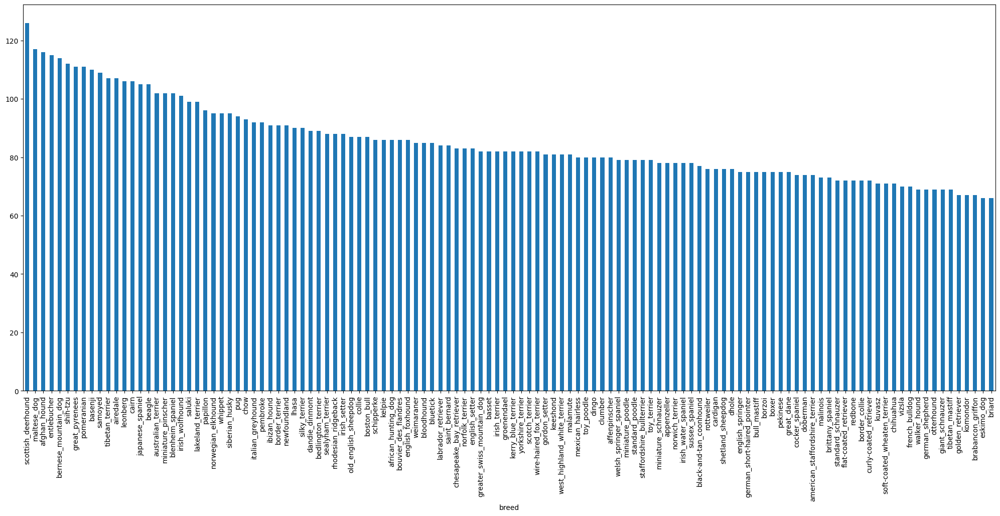

In [3]:
#Let's check how many iamges are there for each breed?
labels_csv.breed.value_counts().plot.bar(figsize=(25,10));

In [4]:
print(f"Meadian of no of images from each brred:{labels_csv.breed.value_counts().median()}")
print(f"Mean of no of images from each brred:{labels_csv.breed.value_counts().mean():.2f}")

Meadian of no of images from each brred:82.0
Mean of no of images from each brred:85.18


In [5]:
# list of all dogs breed names.
unique_breeds=labels_csv.breed.unique()
print(len(unique_breeds))
print(unique_breeds)


120
['boston_bull' 'dingo' 'pekinese' 'bluetick' 'golden_retriever'
 'bedlington_terrier' 'borzoi' 'basenji' 'scottish_deerhound'
 'shetland_sheepdog' 'walker_hound' 'maltese_dog' 'norfolk_terrier'
 'african_hunting_dog' 'wire-haired_fox_terrier' 'redbone'
 'lakeland_terrier' 'boxer' 'doberman' 'otterhound' 'standard_schnauzer'
 'irish_water_spaniel' 'black-and-tan_coonhound' 'cairn' 'affenpinscher'
 'labrador_retriever' 'ibizan_hound' 'english_setter' 'weimaraner'
 'giant_schnauzer' 'groenendael' 'dhole' 'toy_poodle' 'border_terrier'
 'tibetan_terrier' 'norwegian_elkhound' 'shih-tzu' 'irish_terrier'
 'kuvasz' 'german_shepherd' 'greater_swiss_mountain_dog' 'basset'
 'australian_terrier' 'schipperke' 'rhodesian_ridgeback' 'irish_setter'
 'appenzeller' 'bloodhound' 'samoyed' 'miniature_schnauzer'
 'brittany_spaniel' 'kelpie' 'papillon' 'border_collie' 'entlebucher'
 'collie' 'malamute' 'welsh_springer_spaniel' 'chihuahua' 'saluki' 'pug'
 'malinois' 'komondor' 'airedale' 'leonberg' 'mexic

In [6]:
# create path name from id column of the data set.
filenames= ["C:\dog_breed_id/data/train/"+fname+".jpg" for fname in labels_csv.id]
filenames[:5]

['C:\\dog_breed_id/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'C:\\dog_breed_id/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'C:\\dog_breed_id/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'C:\\dog_breed_id/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'C:\\dog_breed_id/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

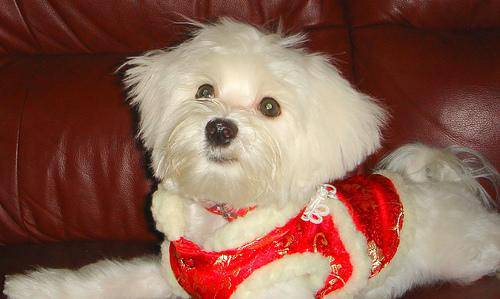

In [7]:
# lets check image directly from a file path
Image(filenames[12])# my luck number is 12 ;)

# Pre-processing images and labels

In [8]:
# convert labels into numpy arrays
labels=labels_csv.breed.to_numpy()
labels[:5]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever'],
      dtype=object)

* Let's use unique_breeds (created earlier) to convert labels array into a booleans array.

In [9]:
# Turn every label into a boolean array
boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False,  True, False, False, False, Fal

In [10]:
#Coverting data into numeric dataform b4 passing it to the machine larning model
print(labels[0])
print(np.where(unique_breeds==labels[0])[0][0])#index where label occurs
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
0
0
[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [11]:
# Define image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

#Modeling

Since kaggle doesn't provide a validation set from its side . We will need to make one from our side.

## Splitting into train and valid

In [12]:
X=filenames
y=boolean_labels

since we are working with 10,000+ iamges ,training and experimentation would take a fairly long time.And our goal when working through machine learning projects is to reduce the time between experimentations.

In [13]:
#Set number of images to use for experimenting
NUM_IMAGES= 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [14]:
#spliting into training and validation using NUM_IMAGES
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [15]:
#checking on
X_train[:5],y_train[:2]

(['C:\\dog_breed_id/data/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'C:\\dog_breed_id/data/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'C:\\dog_breed_id/data/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'C:\\dog_breed_id/data/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'C:\\dog_breed_id/data/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False,  True, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
 

## Creating data batches

In [16]:
# create a simple function to return a tuple(image,label)
def get_image_label(image_path,label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image,label).
  """
  image=process_image(image_path)
  return image,label

We'll set a default batch size of 32 because [According to Yann LeCun](https://twitter.com/ylecun/status/989610208497360896?s=20) (one of the Og's of deep learning).

Friends dont let friends train with batch sizes over 32.

In [17]:
# define a batch size
BATCH_SIZE=32
#A function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  #If the data is a test dataset, we probably sont have labels
  if test_data:
    print("Creating test data batches...lets goo ")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))# only filepaths
    data_batch=data.map(process_image).batch(BATCH_SIZE) #The map method applies the function to each element of the dataset.
    return data_batch
  elif valid_data:
    #If the dataset is validation set
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    #if the data is a training dataset,
    print("Creating training data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data=data.shuffle(buffer_size=len(X))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch




In [18]:
#Create training and validation data batches
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


## Visualizing Data batches:

In [19]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(15, 15))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

using **as_numpy_iterator()**: The as_numpy_iterator() method in TensorFlow's tf.data.Dataset API provides a way to iterate over the elements of a dataset and convert each element into a NumPy array.

Passing an iterable to **next()** will return the next item in the iterator.


In our case, next will return a batch of 32 images and label pairs.

Train images shape:(32, 224, 224, 3)
Train labels shape:(32, 120)


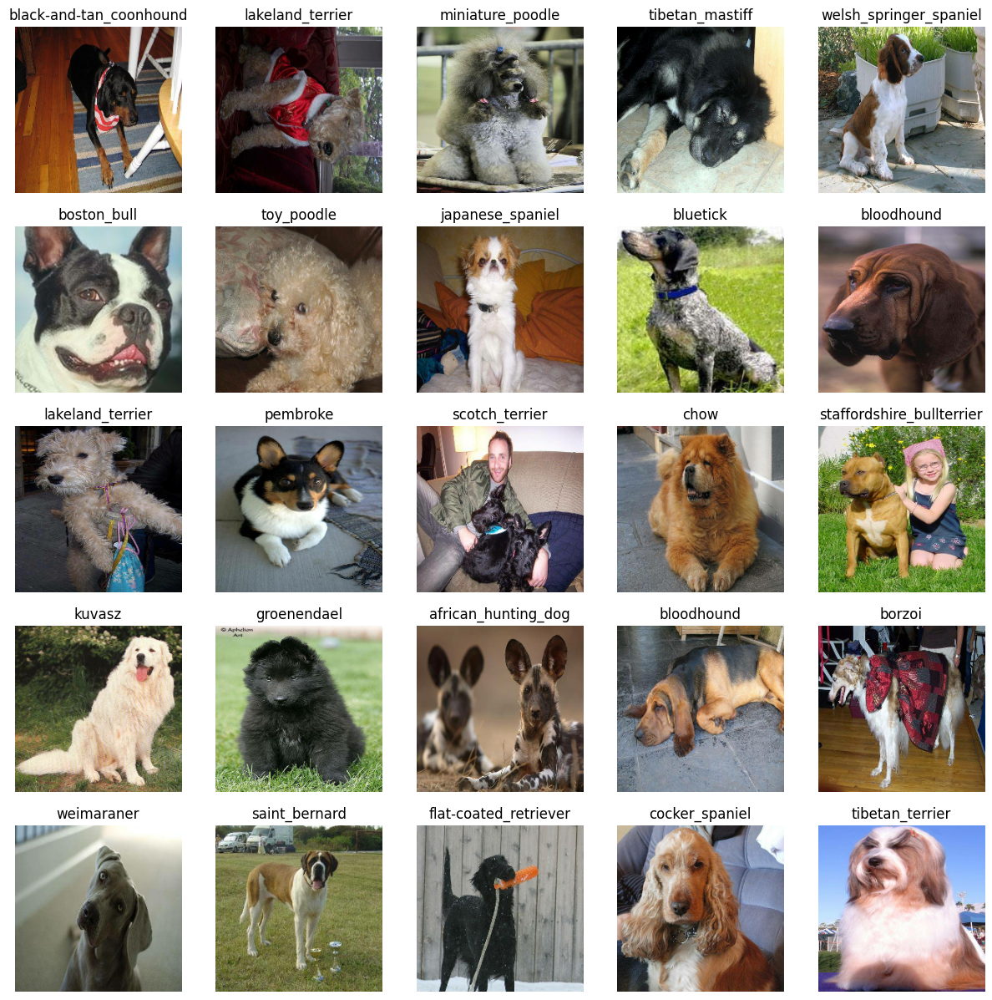

In [20]:
#Visualize training iamges from the traing data batch
train_images,train_labels=next(train_data.as_numpy_iterator())
print(f"Train images shape:{train_images.shape}")
print(f"Train labels shape:{train_labels.shape}")
show_25_images(train_images,train_labels)

Validation images shape: (32, 224, 224, 3)
Validation labels shape: (32, 120)


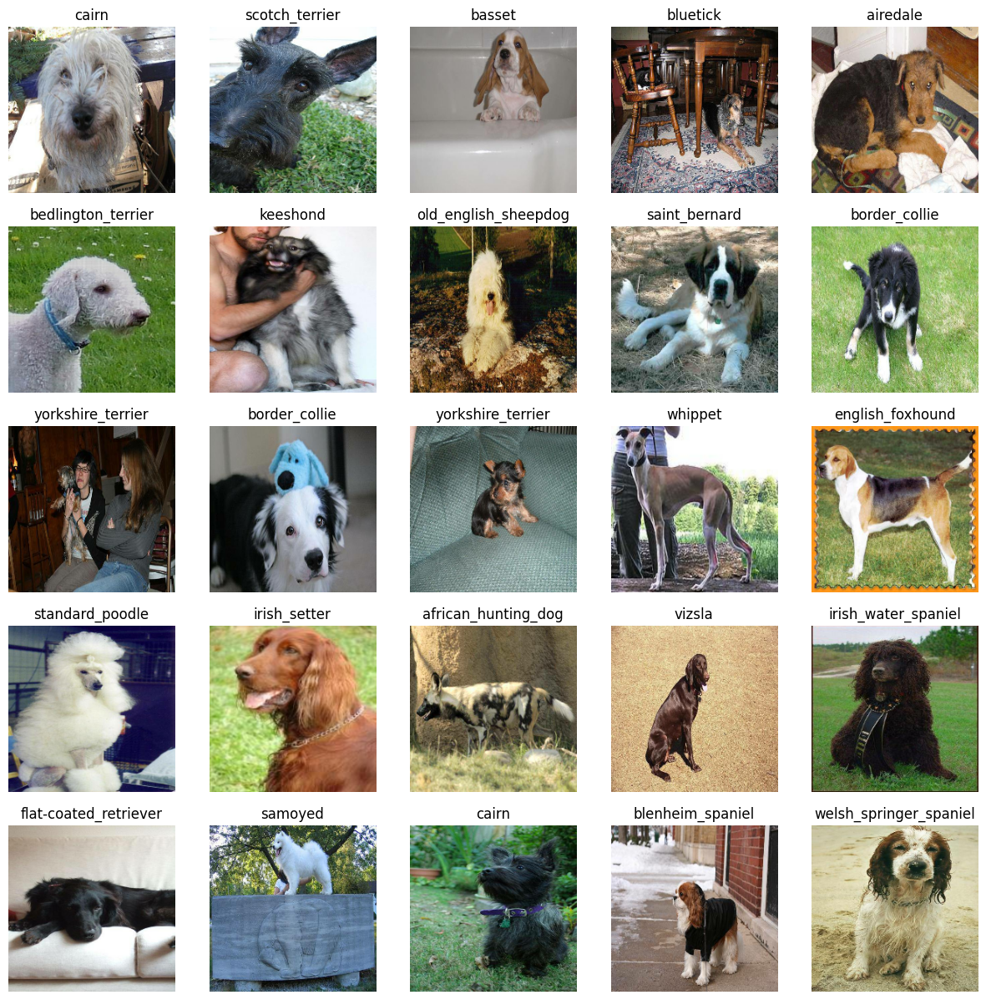

In [21]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
print(f"Validation images shape: {val_images.shape}")
print(f"Validation labels shape: {val_labels.shape}")
show_25_images(val_images, val_labels)

## Creating and training the model

In [22]:
#Define the input shape the the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]
#Define the output shape of the model
OUTPUT_SHAPE=len(unique_breeds)# Number of Unique labels
#setup model URL from TensorFLow Hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"
# https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
# https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [25]:
#Create a function to build the model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  """
  Takes a TensorFlow Hub feature vector URL and creates a Keras Sequential model with it.
  Returns the model.
  """
  model=tf_keras.Sequential([
      hub.KerasLayer(MODEL_URL),
    tf_keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax")
  ])

  model.compile(
    loss=tf_keras.losses.CategoricalCrossentropy(),
    optimizer=tf_keras.optimizers.Adam(),
    metrics=["accuracy"]
)

  model.build(INPUT_SHAPE)
  return model


In [ ]:
model=create_model()
model.summary()

### Creating callbacks

#### Tensorboard Callback

In [ ]:
#Load the Tensorboard notebook extension
%load_ext tensorboard
#create a function to build a TensorBoard callback
def create_tensorboard_callback():
  """
  Creates a TensorBoard callback instance with the current time.
  """
  #create a log directory for storing TensorBoard logs
  logdir=os.path.join("drive/My Drive/Data/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

#### Early Stopping Callback

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

###Training Model( on a subset of data)

In [ ]:
NUM_EPOCHS=100  #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
#Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns thetrained model.
  """
  #Create a model
  model=create_model()
  #Create a TensorBoard callback
  tensorboard=create_tensorboard_callback()
  #Fitting the model we created
  model.fit(x=train_data,epochs=NUM_EPOCHS,validation_data=val_data,callbacks=[tensorboard,early_stopping],validation_freq=1)
  return model



In [ ]:
model=train_model()

###Checking the TensorBoard logs


In [ ]:
%tensorboard --logdir drive/My\ Drive/Data/logs

#Making and evaluating the model on cross_validation set

In [ ]:
#Making prediction using the trained model.
predictions=model.predict(val_data,verbose=1)
print(predictions.shape)
predictions[0]

In [ ]:
#First predictions
sample=(predictions[12])
print(f"Maximum value(Probability of Prediction):{np.max(sample)}")
print(f"Sum of all values(Probability of Prediction):{np.sum(sample)}")
print(f"Max index of the prediction:{np.argmax(sample)}")
print(f"Predicted label:{unique_breeds[np.argmax(sample)]}")

**Predictions Probabilities are also known as confidense levels.**

In [ ]:
#turn prediction probabilities into their respective labels
def get_pred_label(pred_probabilities):
  """
  Turns an array of prediction probabilities into their respective labels.
  """
  return unique_breeds[np.argmax(pred_probabilities)]

In [ ]:
#Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) tensor and returns separate arrays
  for images and labels.
  """
  images=[]
  labels=[]
  #Loop through unbatches data
  for image,labels in data.unbatch().as_numpy_iterator():
    images.append(image.numpy())
    labels.append(labels.numpy())
  return images,labels

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n],unique_breeds[np.argmax(labels[n])], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # print(pred_label)
  # print(true_label)
  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    plt.title(f"{pred_label} {np.max(pred_prob)*100:.2f}%  {true_label}", color="green")
  else:
    plt.title(f"{pred_label} {np.max(pred_prob)*100:.2f}% {true_label}", color="red")

  # plt.title(f"{pred_label} {np.max(pred_prob)*100:.20f}  {true_label}",color=color)

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n],unique_breeds[np.argmax(labels[n])]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9
               )

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

#Saving and reloading a model

In [ ]:
def save_model(model,suffix=None):
  modeldir=os.path.join("drive/My Drive/Data/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path=modeldir+"-"+suffix+".h5"# Save format of model
  print(f"Savinf model to :{model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  print(f"Loading the model from :{model_path}")
  model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
  return model

#Traing  a model (on th efull data)


In [ ]:
full_data=create_data_batches(X,y)

In [ ]:
full_model=create_model()

In [ ]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_early_stopping])

In [ ]:
# Save model to file
save_model(full_model, suffix="all-images-Adam")

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/My Drive/Data/models/20240717-121009-all-images-Adam.h5')

# Making Predictions

In [ ]:
# Load test image filenames (since we're using os.listdir(), these already have .jpg)
test_path = "C:\dog_breed_id/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]
len(test_filenames)

In [ ]:
test_data=create_data_batches(test_filenames,test_data=True)

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

In [ ]:
# Check out the test predictions
test_predictions[:10]

#Preparind Data set for Kaggle submission

In [ ]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

In [ ]:
# Append test image ID's to predictions DataFrame
test_path = "drive/My Drive/test/"
preds_df["id"] = [(os.path.splitext(path)[0] )for path in os.listdir(test_path)]
preds_df.head()

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.shape

In [ ]:
preds_df.to_csv("drive/My Drive/Data/full_submission_1_mobilienetV2_adam.csv",
                 index=False)

#Making prediction on costom iamges


In [ ]:
custom_path="C:\dog_breed_id/Data/dogs/"
custom_image_paths=[custom_path+fname for fname in os.listdir(custom_path)]

In [ ]:
custom_data = create_data_batches(custom_image_paths, test_data=True)

In [ ]:
custom_preds = loaded_full_model.predict(custom_data)
# print (custom_preds)

In [ ]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels[:10]

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)